In this tutorial, we make an introduction to black-box continuous-time models for learning time-series. Our methodology will be built upon the neural ODE (NODE) breakthrough [[chen2018neural]](#References). Instead of presenting a technical discussion on ordinary differential equations (ODEs), we aim to demonstrate how NODEs can be used as practical tools. We also show how to extend the vanilla NODEs to account for uncertainty and to perform latent dynamical modeling.

#### Organization of the Lecture
1. Formal descriptions of ODEs<br>
    1.1. Computing ODE solutions<br>
    1.2. Example: Van der Pol oscillator<br>
    1.3. Break: VDP & ODE integration parameters
2. Neural ODEs<br>
    2.1. Problem formulation<br>
    2.2. Maximum likelihood estimation<br>
    2.3. Example: learning VDP sequences with NODE<br>
    2.4. Break: Adjoints<br>
3. Bayesian neural networks (BNNs)<br>
    3.1. Variational inference<br>
    3.2. Example: $1D$ regression with BNNs<br>
    3.3. Break: A quick summary of history of advances in BNNs
4. Bayesian neural ODEs (BNODEs)<br>
    4.1. Example: learning VDP Sequences with BNODE<br>
5. Latent Bayesian neural ODEs (ODEVAE)<br>
    5.1. Variational inference<br>
    5.2. Example: rotating MNIST<br>
    5.3. From ODEVAE to ODE$^2$VAE

#### Practicalities
 - Each section ends with a 10-min break in which you can read the provided material and/or code snippets, ask questions, or just take a rest. Feel free to arrange your breaks in accordance with your needs.
 - In addition to mathematical descriptions of the techniques, we provide short code snippets for the model definitions, training and visualization. Training could be too time consuming for this session; so make sure to load the pre-trained models if you would like to visualize the fits.
 - Most of the implementation in this notebook depends on the provided utility files, some of which might be too involved to grasp immediately. If you're interested, go ahead and check them out. 
 - The following cell imports all the required libraries.

In [1]:
%load_ext autoreload
%autoreload 2
!pip install torch torchdiffeq numpy scipy matplotlib

import numpy as np
from scipy.io import loadmat
from IPython import display

import torch
import torch.nn as nn
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

from bnn          import BNN
from odevae_utils import integrate, integrate_L, get_minibatch
from vae_utils    import MNIST_Encoder, MNIST_Decoder
from plot_utils   import * # all the functions with name plot_x are defined here

## 1. Ordinary Differential Equations (ODEs)
Ordinary differential equations involve an independent variable, its functions and derivatives of these functions. Formally, 

\begin{equation}
    \dot{\mathbf{x}}(t) = \frac{d\mathbf{x}(t)}{dt} = \mathbf{f}(\mathbf{x}(t),\mathbf{u}(t),t),
\end{equation}

where 
- $t$ denotes time (or any other independent variable) 
- $\mathbf{x}(t) \in \mathcal{X} \in \mathbb{R}^d$ is the state vector at time $t$ (thus dependent variable)
- $\mathbf{u}(t) \in \mathcal{A} \in \mathbb{R}^m$ is the external control signal
- $\dot{\mathbf{x}}(t) \in \dot{\mathcal{X}} \in \mathbb{R}^d$ is the first order time derivative of $\mathbf{x}(t)$
- $\mathbf{f} : \mathcal{X} \times \mathcal{A} \times \mathbb{R}_+ \rightarrow \dot{\mathcal{X}}$ is the vector-valued and continuous (time) differential function describing the system's evolution over time with $\mathbb{R}_+$ denoting non-negative real numbers. 

**Note-1**: We occassionaly denote $\mathbf{x}_t \equiv \mathbf{x}(t)$ and refer to $\mathbf{f}$ as *vector field*. <br>
**Note-2**: Above problem is also known as *initial value problem*. <br>
**Note-3**: Throughout this tutorial, we focus on differential functions $\mathbf{f}(\mathbf{x}(t))$ independent of control signals and not explicitly parameterized by time.

### 1.1. Computing ODE Solutions

An "ODE solution" $\mathbf{x}(t)$ at time $t\in \mathbb{R}_+$ is given by
\begin{equation}
	\mathbf{x}(t) = \mathbf{x}_0 + \int_0^t \mathbf{f}(\mathbf{x}_\tau)~d\tau,
\end{equation}
where $\mathbf{x}_0$ denotes the initial value and $\tau \in \mathbb{R}_+$ is an auxiliary time variable. <br> Informally speaking, $\mathbf{f}$ tells "how much the state $\mathbf{x}(t)$ would change with an infinitisemal change in $t$". More formally, below equation holds in the limit $\Delta t \rightarrow 0$: 
\begin{equation}
    \mathbf{x}(t+\Delta t) = \mathbf{x}(t) +  \Delta t \cdot \mathbf{f}(\mathbf{x}(t)).
\end{equation}

**Numerical solvers:** TL;DR: State solution can be numerically computed up to a tolerable error. <br>

The celebrated *Picard's existence and uniqueness theorem* states that an initial value problem has a unique solution if the time differential satisfies the *Lipschitz condition*. Despite the uniqueness guarantee, there is no general recipe to analytically compute the solution; therefore, we often resort to numerical methods. The simplest and least efficient numerical method is known as *Euler's method* (above equation). More advanced methods such as *Heun's method* and *Runge-Kutta* family of solvers compute average slopes by evaluating $\mathbf{f}(\mathbf{x}(t))$ at multiple locations (speed vs accuracy trade-off). Even more advanced *adaptive step* solvers set the step size $\Delta t$ dynamically. 

In this tutorial, we use [torchdiffeq](https://github.com/rtqichen/torchdiffeq) library that implements the adaptive checkpoint adjoint method for gradient estimations. We implemented a wrapper function named `integrate` in `odevae_utils.py` that provides a friendly interface for numerical integration.

### 1.2. Example: Van der Pol Oscillator
As an example, we examine *Van der Pol (VDP) oscillator*, a parametric $2D$ time-invariant ODE system that evolves according to the following:
\begin{equation} \label{eq:vdp}
	\frac{d}{dt} \begin{bmatrix} x_1 \\ x_2 \end{bmatrix}  =  \begin{bmatrix} x_2 \\ \mu(1-x_2^2)x_2-x_1 \end{bmatrix}.
\end{equation}

Our VDP implementatation below follows the two requirements of `torchdiffeq`:
 - Integrated function shall be an instance of `nn.Module`.
 - The `forward()` function must take (time,state) pair as input.

In [2]:
# define the differential function
class VDP(nn.Module):
    def __init__(self,mu):
        ''' mu is the only parameter in VDP oscillator '''
        super().__init__()
        self.mu = mu
    def forward(self, t, x):
        d1 = x[...,1:2]
        d2 = self.mu*(1-x[...,0:1]**2)*x[...,1:2]-x[...,0:1]
        return torch.cat([d1,d2],-1)

Next, we instantiate the three ingredients (differential function $\mathbf{f}$, initial value $\mathbf{x}_0$, integration time points $t$), forward integrate, and visualize how integration proceeds. 

In [3]:
# create the differential function, needs to be a nn.Module
vdp = VDP(1.0).to(device)

# initial value, of shape [N,n]
x0 = torch.tensor([[1.0,0.0]]).float().to(device)

# integration time points, of shape [T]
t = torch.linspace(0., 15., 500).to(device)

# forward integration
with torch.no_grad():
    X = integrate(vdp, x0, t) # [N,T,D]

# animation
from IPython.display import HTML
anim = plot_vdp_animation(t,X,vdp)
HTML(anim.to_jshtml())

### 1.3. Break: VDP & ODE Integration Parameters

Van der Pol oscillator has a single parameter set to 1 above: $\mu=1$. Below cell implements the same illustration, except that we plot instead of animate. Use this break to play around with the parameter $\mu$ and initial value $\mathbf{x}_0$ to see how the tinyest change affects the whole trajectory. Note that below we visualize two trajectories as $\mathbf{x}_0$ contains two initial values.

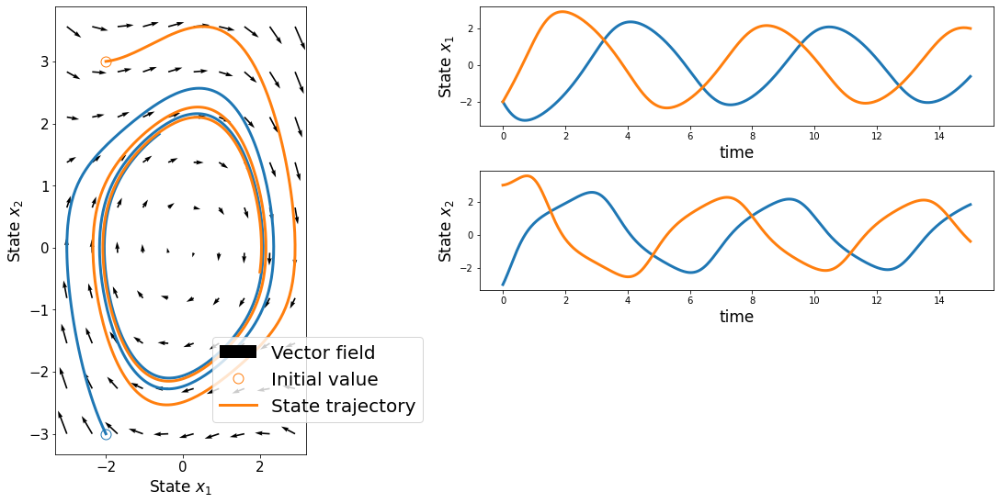

In [4]:
# feel free to modify the parameter
vdp = VDP(0.2).to(device)

# feel free to try out different initial values
x0 = torch.tensor(
    [[-2.0,-3.0],[-2.0,3.0]]
).float().to(device)

# integration time points, of shape [T]
t = torch.linspace(0., 15., 500).to(device)

# forward integration
with torch.no_grad():
    X = integrate(vdp, x0, t) # [N,T,D]

plot_ode(t,X,vdp)

## 2. Neural ODE (NODE)

Neural ODE model [[chen2018neural]](#References) was published in NeurIPS 2018, and has drawn a great deal of interest. A one-sentence summary of the model could be <br><br>

<div align="center">
  <strong> an ODE system in which the differential function is a neural network (NN). </strong>
</div>

Why is this model useful? Imagine that we observe a sequence $\mathbf{x}_{0:N}$ that is generated by a continuous-time system (the sequence could be the measurements from a physical system, motion of objects, ﬂow of electric current, substance rates in a chemical reaction, etc). How can we find the time evolution of the observed states?

 - If we know the underlying ODE (such as the VDP system), we can use statistics and optimization tools to estimate parameters ($\mu$).
 - If we do not know what functional form and/or the parameters of the ODE system? We estimate the time evolution function by any function approximator (In practice, one could define GP-ODEs, linear-regression-ODEs, kernel-regression-ODEs, etc). 

**Remark:** The original NODE paper describes the model starting from discrete machine learning models such as residual networks (ResNets), recurrent neural networks (RNN), and normalizing flows (NF). Here, we take an alternative approach by formulating it directly from a continuous-time modeling standpoint.

### 2.1. Problem Formulation
In this tutorial, we study the second approach. More specifically, our dataset contains an observation sequence $\mathbf{y}_{0:N}$ 

\begin{align}
    \mathbf{y}_n &= \mathbf{x}_n + \epsilon, \qquad \epsilon\sim\mathcal{N}(0,\sigma^2),
\end{align}

where each observation is a perturbation of an unknown state $\mathbf{x}_n$ generated by an unknown underlying vector field $\mathbf{f}_\text{true}$

\begin{align}
	\mathbf{x}_n &= \mathbf{x}_0 + \int_0^{t_n} \mathbf{f}_\text{true}(\mathbf{x}_\tau)~d\tau.
\end{align}

Our goal is to learn a neural network $\mathbf{f}_\mathbf{w}$ with parameters $\mathbf{w}$ that matches the unknown dynamics:

$$\mathbf{f}_\mathbf{w} \approx \mathbf{f}_\text{true}.$$

Let's start by implementing a NODE system. We use a simple multi-layer perceptron with two hidden layers. Since vector fields are smooth, we opt for the smooth `ELU` activation instead of `ReLU`.

In [6]:
class NODE(nn.Module):
    def __init__(self, d):
        ''' d - ODE dimensionality '''
        super().__init__()
        self._f = nn.Sequential(nn.Linear(d,200), nn.ELU(), nn.Linear(200,200), nn.ELU(), nn.Linear(200,d))
    
    @property
    def ode_rhs(self):
        ''' returns the differential function '''
        return lambda t,x: self._f(x)
    
    def forward(self, t, x0, method='dopri5'):
        ''' Forward integrates the NODE system
            Input
                t  - [T]   time points
                x0 - [N,d] initial value
            Returns
                X  - [N,T,d] forward simulated states
        '''
        return integrate(self.ode_rhs, x0, t)

node = NODE(2).to(device)

Now, let's see what the forward trajectory $\mathbf{x}_{0:N}$ looks like when the differential function $\mathbf{f}_\mathbf{w}$ is a NN with randomly initialized weights $w_i \sim \mathbb{U}(-k,k)$. Here, $\mathbb{U}$ and $k$ denote the uniform distribution and the number of input features. As you will see below, small random weights typically translate into smooth and small functions outputs, making the initial trajectory smooth as well. 

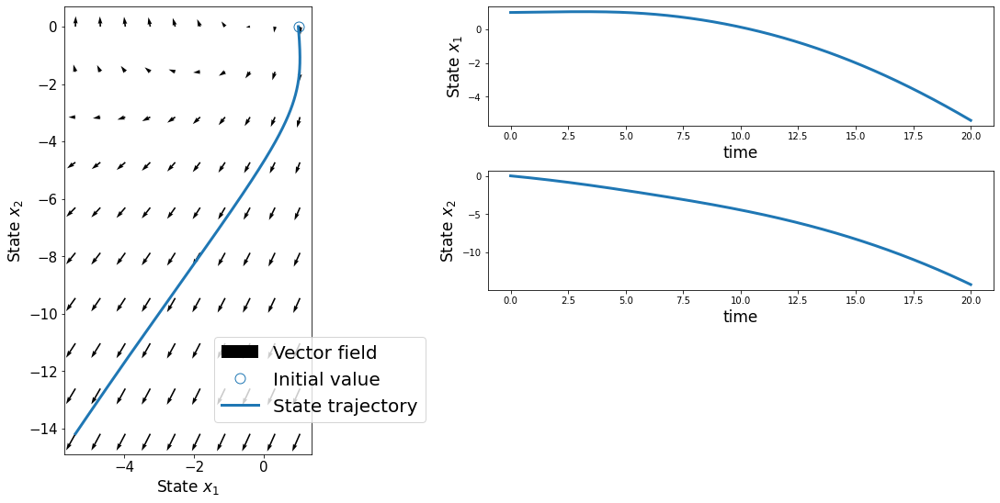

In [7]:
# let's compute the integral of our neural net!
x0   = torch.tensor([[1.0,0.0]]).float().to(device)
t    = torch.linspace(0., 20., 1000).to(device)

X = node(t,x0)
plot_ode(t, X, node.ode_rhs)

### 2.2. Maximum Likelihood Estimation

The simplest approach to approximate the unknown vector field $\mathbf{f}_\text{true}$ is the maximum-likelihood estimation. Since we do not have access to the vector field $\mathbf{f}_\text{true}$, we propose to match the forward simulated states with the observations:

\begin{align}
	\min_\mathbf{w} ~~ \mathcal{L} = \frac{1}{2} \sum_n ||\mathbf{y}_n-\mathbf{x}_n||_2^2 \qquad \text{s.t.} \qquad \mathbf{x}_n = \mathbf{x}_0 + \int_0^{t_n} \mathbf{f}_\mathbf{w}(\mathbf{x}_\tau)~d\tau.
\end{align}

Observe that forward simulated states $\mathbf{x}(t)$ are functions of NN parameters $\mathbf{w}$. In the following, we show the dependency explicitly $\mathbf{x}(t;\mathbf{w})$. The gradient of the loss wrt $\mathbf{w}$ can be computed by chain rule:

\begin{align}
    \frac{d\mathcal{L}}{d\mathbf{w}} = \sum_n (\mathbf{x}(t_n;\mathbf{w})-\mathbf{y}_n) \frac{d\mathbf{x}(t_n;\mathbf{w})}{d\mathbf{w}}
\end{align}

The second term is the derivative of the forward simulated state $\frac{d\mathbf{x}(t_n;\mathbf{w})}{d\mathbf{w}}$ against the vector field parameters $\mathbf{w}$. In other words, we need to compute the derivative through the ODE solver, which is not a straightforward task. This can be done by **forward sensitivity** or **adjoints** equations. Both techniques compute the gradient by solving a second ODE system. Due to its lower memory footpring, `torchdiffeq` library implements the latter.

### 2.3. Example: Learning VDP Sequences with NODE

Next, we test our NODE system on noisy VDP sequences. To generate data, we randomly pick 10 initial values and forward integrate all trajectories concurrently. Luckily, this only requires setting the initial values and the rest of the implementation stays the same.

Plotting the first 3 data sequences.


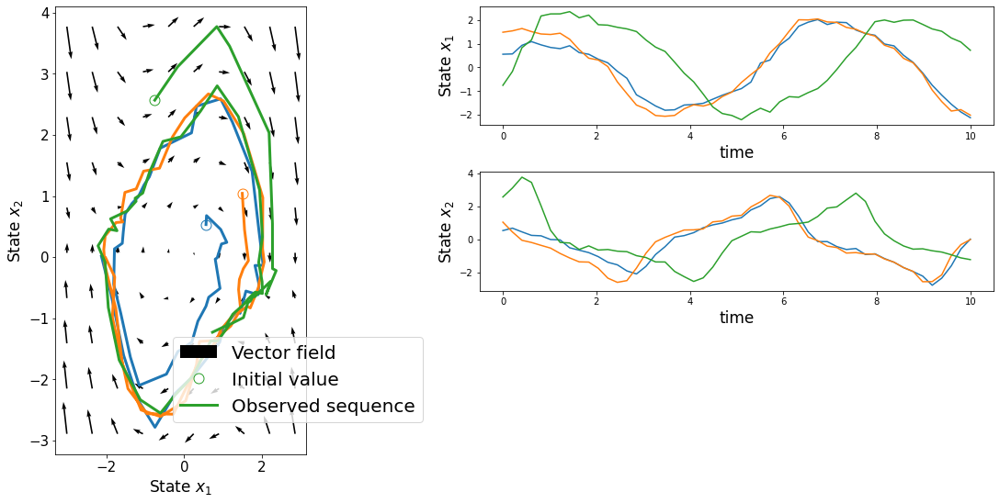

In [8]:
# lets first generate data
vdp = VDP(1.0).to(device)
x0 = 6*torch.rand([10,2]).to(device) - 3 # 10 random initial values in [-3,3]
tvdp = torch.linspace(0., 10., 50).to(device) # note the shorter sequence
with torch.no_grad():
    Xvdp = integrate(vdp, x0, tvdp)
    Yvdp = Xvdp + torch.randn_like(Xvdp)*0.1 # noisy data with observation noise has std 0.1

plot_vdp_trajectories(tvdp, Yvdp, vdp)

We now train the model on the observed sequences. To speed up the training, we optimize for a subsequence instead of the whole sequence (see `get_minibatch` function in `odevae_utils.py`).

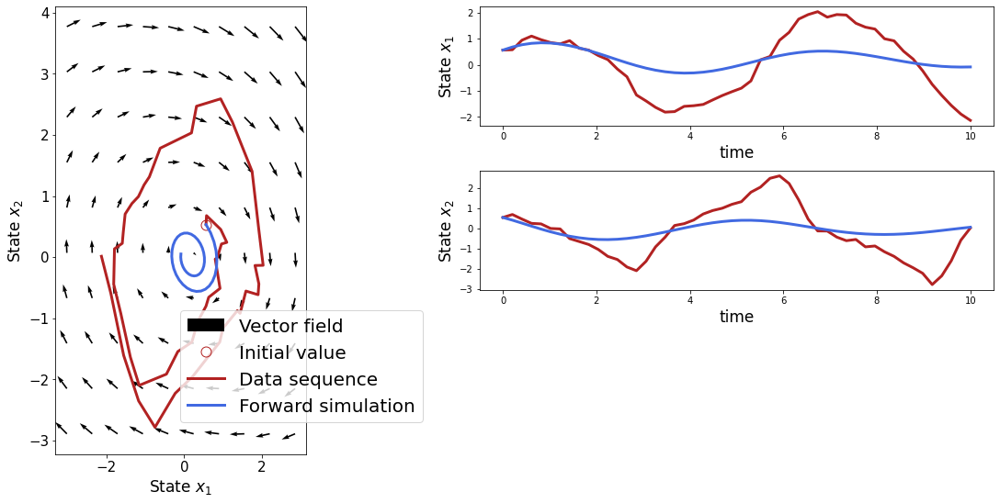

KeyboardInterrupt: 

In [9]:
# optimization loop
Niter  = 1000 # number of optimization iterations
tsub   = 10   # subsequence length in each minibatch

optimizer = torch.optim.Adam(node.parameters(),1e-3)
for i in range(Niter):
    optimizer.zero_grad()
    t_,Y_ = get_minibatch(tvdp, Yvdp, tsub=tsub)
    Xhat = node(t_, Y_[:,0]) # forward simulation
    loss = ((Xhat-Y_)**2).mean() # MSE
    loss.backward()
    optimizer.step()
    if i%50==0:
        Xhat = node(tvdp, Yvdp[:,0]) # forward simulation
        display.clear_output(wait=True)
        plot_ode(tvdp, Yvdp, node.ode_rhs, Xhat.detach())

Finally, let's load and visualize a trained model.

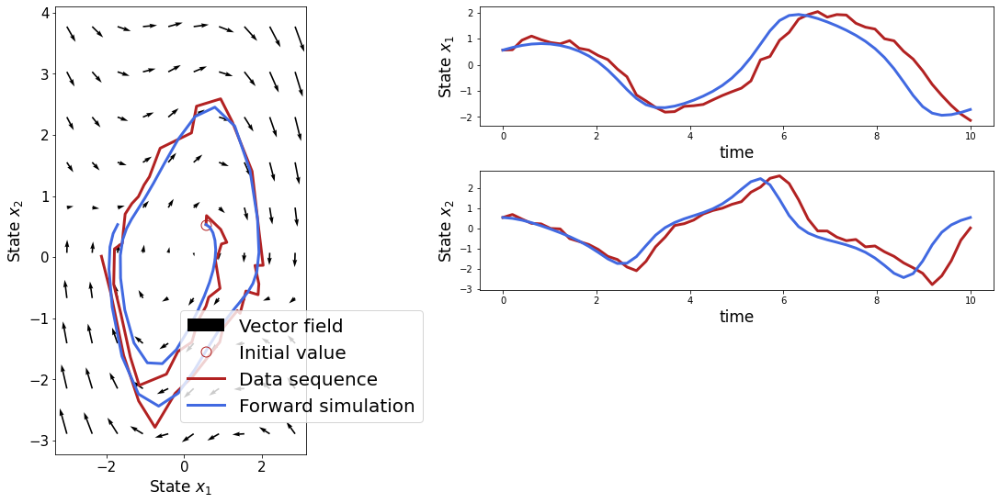

In [10]:
state_dict = torch.load('etc/trained_node.pkl')
node.load_state_dict(state_dict)
node.eval()

Xhat = node(tvdp, Yvdp[:,0]) # forward simulation
plot_ode(tvdp, Yvdp, node.ode_rhs, Xhat.detach())

### 2.4. Break: NN Differential Function and/or Adjoints

For this break, we have two suggestions to look into:
- If you would like to play around with the differential function, go ahead and try out shallower/deeper nets, other activations, smaller/larger weight initializations, etc.
- If you are more into theory, take a look at the adjoints, which are the ODEs that give us the gradients of an ODE system. You can read Section 2.1 of [this tutorial](https://cs.stanford.edu/~ambrad/adjoint_tutorial.pdf) or Sections 1 and 3 of [this techical report](https://bartlettroscoe.github.io/publications/TransientSensitivitiesDerivation.pdf) for a derivation of adjoints.

## 3. Bayesian Neural Networks (BNNs)

Despite the universal function approximation guarantees, vanilla deterministic NNs suffer from two significant limitations:

 - First, since deeper and wider NNs with more parameters almost always achieve better fits to the training data, blindly minimizing some error function with respect to model parameters prevents us from determining the appropriate level of complexity. To tackle this problem, researchers typically resort to ad-hoc regularization terms, additional dropout "layers" and validation sets.
 - Second, computing point estimates for the unknown parameters does not allow us to quantify model uncertainty, which makes risk assessment and decision making difficult in safety-critical applications.
 
Solution? Bayesian modeling! Given an iid dataset $Y=\{\mathbf{y}_1,\ldots,\mathbf{y}_N\}$, we simply define a prior distribution on the weights $\mathbf{w} \in \mathbb{R}^P$, e.g., 
$$ p(\mathbf{w}) = \prod_p \mathcal{N}(w_p; 0,\sigma^2)$$
and perform Bayes' rule
$$ p(\mathbf{w} | Y) \propto \prod_n p(\mathbf{y}_n|\mathbf{w}) p(\mathbf{w}).$$

### 3.1. Variational Inference
Possibly the simplest approximation to the unknown true posterior is given by a mean-field approach in which each weight has an independent approximate posterior:
\begin{align}
    q(\mathbf{w}) = \prod_p \mathcal{N}(w_p; \mu_p,\sigma_p^2).
\end{align}
 
Similar to VAEs, we optimize the evidence lower-bound (ELBO) 

\begin{align}
    \log p(\mathbf{Y}) \geq \sum_n \mathbb{E}_{q(\mathbf{w})}[\log p(\mathbf{y}_n|\mathbf{w})] - \text{KL}(q(\mathbf{w}) || p(\mathbf{w})),
\end{align}

where the second term is tractable and the first term can be approximated by Monte Carlo sampling:

\begin{align}
    \mathbb{E}_{q(\mathbf{w})}[\log p(\mathbf{y}_n|\mathbf{w})] \approx \frac{1}{L} \sum_{l=1}^L \log p(\mathbf{y}_n|\mathbf{w}^{(l)})], \qquad w^{(l)}_p \sim \mathcal{N}(\mu_p,\sigma_p^2)
\end{align}

### 3.2. Example: $1D$ Regression with BNNs
Let's test the above framework on a simple $1D$ regression problem. Given a dataset of input and target pairs $\mathbf{Y}=\{(\mathbf{x}_n,\mathbf{y}_n)\}_{n=1}^N$, we aim to approximate the unknown mapping $\mathbf{f}$ with a BNN. For simplicity, we consider homoscedastic noise with std $0.1$: 

\begin{align}
    \mathbf{y}_n = \mathbf{f}(\mathbf{x}_n) + \epsilon, \qquad \epsilon\sim \mathcal{N}(0,0.1^2).
\end{align}

In the following cell, we generate some synthetic data.

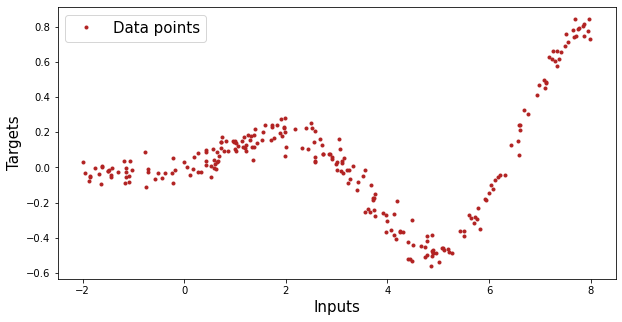

In [11]:
# true unknown function
f = lambda x: nn.Softplus()(x) * x.sin() / 10

# training inputs
xbnn = torch.rand([250,1],device=device)*10-2
xbnn = xbnn[xbnn.view(-1).sort()[1]]

# training outputs
ybnn = f(xbnn).detach() + torch.randn_like(xbnn)*0.05

# test inputs (have a wider range to demonstrate BNN's uncertainty handling) 
xtest = torch.rand([250,1],device=device)*20-8
xtest = xtest[xtest.view(-1).sort()[1]]

# visualize the dataset
plot_1D_regression(xbnn, ybnn)

Now let's create our Bayesian neural network. Please see `bnn.py` for a simple BNN implementation.

In [12]:
bnn = BNN(n_in=1, n_out=1, n_hid_layers=2, n_hidden=100, act='relu').to(device)
print(bnn)

BNN
Layer-1: [100, 1]	ReLU()
Layer-2: [100, 100]	ReLU()
Layer-3: [1, 100]	Identity()



We now implement the ELBO. Note that we use $L=10$ Monte Carlo draws to approximate the expected log-likelihood.

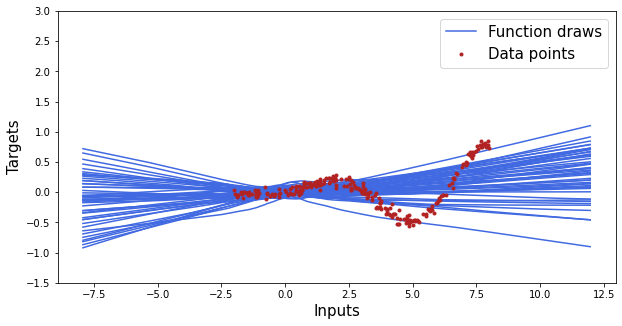

KeyboardInterrupt: 

In [13]:
L      = 10  # number of Monte Carlo draws to approximate the likelihood
sig    = 0.1 # observation noise parameter
Niter  = 10000

optimizer = torch.optim.Adam(bnn.parameters(),1e-3)
for i in range(Niter):
    optimizer.zero_grad()
    xhat = bnn(xbnn, L=L) # [L,N,d]
    rec = -0.5*torch.sum(((xhat-ybnn)/sig)**2)/L - torch.log(torch.ones_like(ybnn)*sig).sum()
    kl = bnn.kl()
    loss = -rec + kl
    loss.backward()
    optimizer.step()  
    if i%50==0:
        xtest_hat = bnn(xtest,L=50).detach().cpu()
        display.clear_output(wait=True)
        plot_1D_regression(xbnn, ybnn, xtest, xtest_hat)      

Finally, let's load and visualize a nicely trained model.

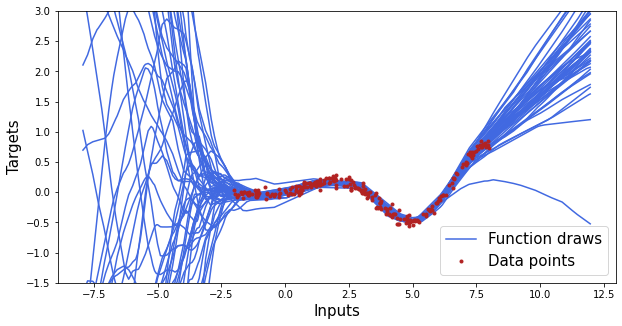

In [14]:
state_dict = torch.load('etc/trained_bnn.pkl')
bnn.load_state_dict(state_dict)
bnn.eval()
xtest_hat = bnn(xtest,L=50).detach().cpu()
plot_1D_regression(xbnn, ybnn, xtest, xtest_hat)      

### 3.3 Break: BNN Inference with weighted KL and/or Historical Note

In this break, we again propose two alternatives you can explore:

#### a. Understanding ELBO
You can try to understand how the KL term changes the optimization procedure (and thus the optimal solution the above regression problem). You can do this by multiplying the `kl` parameter by a constant $\beta$ so that 

$$\text{loss} = -\text{rec} + \beta \cdot \text{kl}.$$

Good starting values are the extremes, e.g., $\beta=0$ or $\beta=1000$. Also, see the "Fixing the Broken ELBO" paper [[alemi2018fixing]](#References) for the theoretical foundations of this trick.


#### b. Historical Note on BNNs
 - The pioneering work by [[mackay1992practical]](#References) describes the first Bayesian treatment of neural networks by placing a Gaussian prior distribution on the weights.
 - Radford Neal showed that under certain assumptions, an infinitely wide BNN approximates a Gaussian process [[neal1995bayesian]](#References).
 - [[neal1995bayesian]](#References) also specified different types of priors and also infers NN parameters by hybrid Monte Carlo (later known as Hamiltonian Monte Carlo (HMC)) [[neal2011mcmc]](#References).
 - To speed up the inference, [[blundell2015weight]](#References) resorts to variational inference by placing a Gaussian posterior with diagonal covariance on the weights.
 - [[hernandez2015probabilistic]](#References) introduces probabilistic back-prop, which propagates distributions through the network an  approximate them with Gaussians (also known as assumed density filtering). 
 - Later, [[gal2016dropout]](#References) shows that dropout equivalent to a BNN with Bernoulli variational distribution (operating on the columns of the weight matrices).
 - [[lakshminarayanan2017simple]](#References) proposes "deep ensembles", a collection of point estimates in the weight space that gives some measure of uncertainty.   
 - [[sun2019functional]](#References) describe "functional BNNs", which define the prior distribution on the function output instead of weights. 
 - Recently, [[izmailov2021what]](#References) thoroughly analyzed the true posterior with HMC.
 - See the following figure (taken from [[jospin2020hands]](#References)) for a taxonomy of above methodologies.

<img src="etc/bnn.png" width="80%"/>

## 4. Bayesian Neural ODEs

We now propose a Bayesian treatment for Neural ODEs. Similar to NODEs, we assume a dataset of $R$ sequences $\mathbf{Y}=\{\mathbf{y}_{0:N}^{(r)}\}_{r=1}^R$ generated by the an unknown vector field $\mathbf{f}_\text{true}$ that we approximate by a neural network $\mathbf{f}_\mathbf{w}$. Our variational inference goal is to compute an approximate posterior for the weights $\mathbf{w}$. We simply follow the generic derivation in the previous section with the following approximation to the expected log-likelihood:

\begin{align}
    \mathbb{E}_{q(\mathbf{w})}[\log p(\mathbf{Y}|\mathbf{w})] \approx \frac{1}{L} \sum_{l=1}^L \sum_{r=1}^R \sum_{n=0}^N  \log p(\mathbf{y}_n^{(r)}|\mathbf{x}_n^{(r,l)},\sigma^2),
\end{align}

where state solution samples $\mathbf{x}_n^{(r,l)}$ are obtained by first drawing a vector field sample
$$ w^{(l)}_p \sim \mathcal{N}(\mu_p,\sigma_p^2) $$
and then forward simulating
\begin{align}
    \mathbf{x}_n^{(r,l)} = \mathbf{x}_0^{(r)} + \int_0^{t_n} \mathbf{f}_{\mathbf{w}^{(l)}}(\mathbf{x}_\tau)~d\tau.
\end{align}

Note that ODE systems, by definition, require differentiable time differentials $\mathbf{f}(\cdot)$ while BNNs are stochastic. Therefore, our inference scheme must rely on function sampling, where each function draw is deterministic. This can be done by drawing the weights before integration and keeping them fixed throughout integration.

Let's finally visualize the samples drawn from the inferred function.

The following cell implements a Bayesian NODE (BNODE). To further speed up the training, we integrate $L>1$ vector fields concurrently. Thus, `forward()` function returns state trajectories of shape `[L,N,T,d]`. Despite the increase in execution time, bigger $L$ values are more favorable due to reduced gradient variance.

In [15]:
# Bayesian neural ODE implementation
class BNODE(nn.Module):
    def __init__(self, d):
        ''' d - ODE dimensionality '''
        super().__init__()
        self._f = BNN(n_in=d, n_out=d, n_hid_layers=2, n_hidden=100, act='elu')
    
    def draw_vector_field(self,L=1):
        ''' returns L vector field samples '''
        f = self._f.draw_f(L=L)
        return lambda t,x: f(x)
    
    def forward(self, t, x0, L=1):
        ''' Forward integrates the NODE system
            Input
                t  - [T]   time points
                x0 - [N,d] initial value
            Returns
                X  - [L,N,T,d] forward simulated states
        '''
        ode_rhs = self.draw_vector_field(L=L)
        return integrate_L(ode_rhs, x0, t, L=L)

bnode = BNODE(2).to(device)

### 4.1. Example: Learning VDP Sequences with BNODE
Let's learn the same VDP sequences using a BNODE.

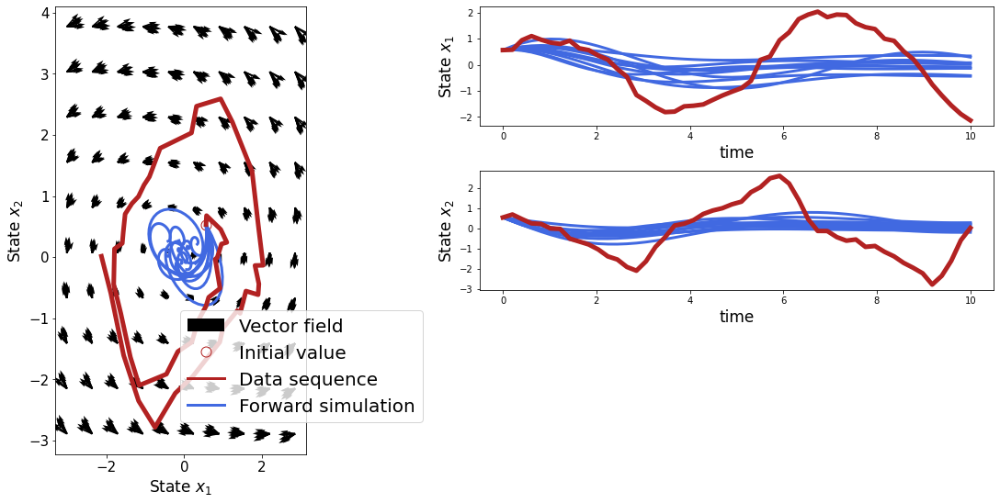

RuntimeError: python_error

In [16]:
L     = 25  # number of Monte Carlo draws to approximate the likelihood
sig   = 0.1 # observation noise parameter
Niter = 1000

optimizer = torch.optim.Adam(bnode.parameters(),1e-3)
tsub = 10 # subsequence length
C    = len(tvdp) / tsub # scaling factor

for i in range(Niter):
    optimizer.zero_grad()
    t_,Y_ = get_minibatch(tvdp,Yvdp,tsub=tsub)
    Xhat = bnode(t_, Y_[:,0], L=L) # forward simulation
    rec  = -0.5*torch.sum(((Xhat-Y_)/sig)**2)/L - torch.log(torch.ones_like(Y_)*sig).sum()
    rec  = rec*C # re-scale the likelihood term based on minibatch size
    kl   = bnode._f.kl()
    loss = -rec + kl 
    loss.backward()
    optimizer.step()
    if i%50==0:
        Lplot = 10 # number of Monte Carlo draws used for plotting
        ode_rhs = bnode.draw_vector_field(L=Lplot) # Lplot vector fields
        Xhat = bnode(tvdp, Yvdp[:,0], L=Lplot)     # Lplot trajectory samples
        display.clear_output(wait=True)
        plot_ode(tvdp, Yvdp, ode_rhs, Xhat.detach(), L=Lplot)

Let's visualize a trained model.

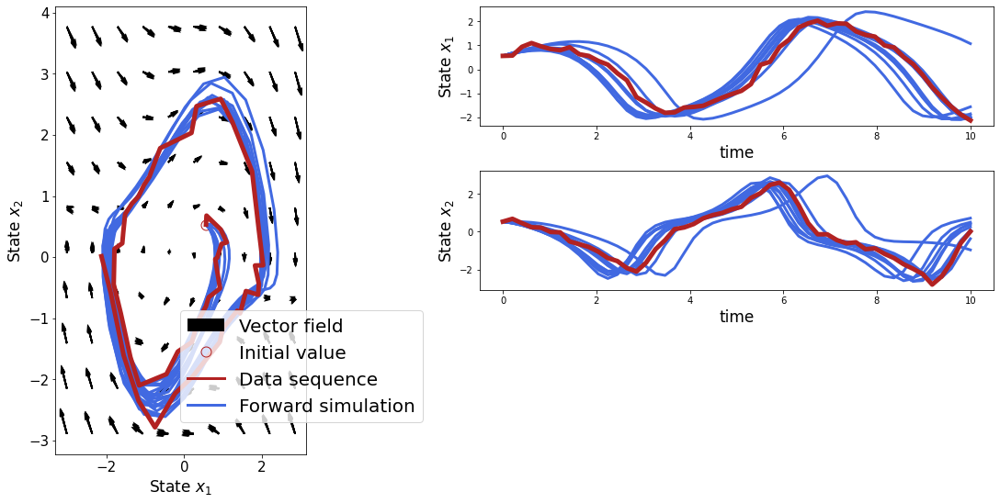

In [17]:
state_dict = torch.load('etc/trained_bnode.pkl')
bnode.load_state_dict(state_dict)
bnode.eval()

ode_rhs = bnode.draw_vector_field(L=10) # 10 vector fields
Xhat = bnode(tvdp, Yvdp[:,0], L=10)     # 10 trajectory samples
plot_ode(tvdp, Yvdp, ode_rhs, Xhat.detach(), L=10)

The resulting model provides some nicely calibrated measure of uncertainty. On the other hand, optimization becomes much more time consuming. In practice, gradually increasing the subsequence length and number of Monte Carlo samples as optimization proceeds help speed-up the execution.

## 5. Latent Bayesian Neural ODEs

All the ODE systems we investigated so far are defined in data space, i.e., the data and the differential equation system are defined in the same space. As an example that contradicts with this modeling choice, consider the video of a flying ball. The motion of the ball can surely be explained by an ODE; however, observations themselves (pixels) do not follow any ODE at all. To handle such cases, a reasonable modeling choice is to simultaneously learn an embedding of the videos into a latent space and learn a latent ODE system that explains the motion. 

A suitable generative model for a given high-dimensional observed sequence $\mathbf{y}_{0:N}$ could be as follows:

\begin{align}
    \mathbf{z}_0 &\sim p(\mathbf{z}_0) \\
    \mathbf{z}_n &= \mathbf{z}_0 + \int_0^{t_n} \mathbf{f}_\text{true}(\mathbf{z}_\tau) d\tau \\
    \mathbf{y}_n &\sim p(\mathbf{y}_n | \mathbf{z}_n), \quad \forall n \in [0,N]
\end{align}

where $\mathbf{z}_n$ corresponds to latent embedding for $\mathbf{y}_n$. We propose to approximate the initial value distribution, the latent dynamics, and the observation mapping with NNs. We furthermore opt for computing approximate posterior distributions for the initial value $\mathbf{z}_0$ and ODE parameters $\mathbf{w}$, which leads to a hybrid ODE-VAE model with
 - an encoder $q_\phi(\mathbf{z}_0|\mathbf{y}_{0:N})$ to approximate the initial value distribution $\mathbf{z}_0$
 - a NODE system $\mathbf{f}_\mathbf{w}$ to approximate the unknown ODE $\mathbf{f}_\text{true}$
 - a decoder $\mathbf{d}_\gamma(\mathbf{z}_n)$ that gives the parameters of the observation mapping $p(\mathbf{y}_n | \mathbf{z}_n)$.

### 5.1. Variational Inference
In the following, we assume a dataset of a single sequence $\mathbf{y}_{0:N}$ for notational clarity. Borrowing the ideas from VAEs and BNODEs, we perform amortized inference for the initial value and mean-field approximation for the dynamics parameters:

$$ q(\mathbf{z}_0,\mathbf{w}|\mathbf{y}_{0:N}) = q_\phi(\mathbf{z}_0|\mathbf{y}_{0:N}) ~ q_\xi(\mathbf{w}).$$ 

Note that extensions to multiple sequences would require variational posteriors for all initial values $\{\mathbf{z}_{0}^{(r)}\} _{r=1}^R$. The ELBO is simply given by

\begin{align}
    \log p(\mathbf{y}_{0:N}) \geq \sum_n \mathbb{E}_{q(\mathbf{z}_0,\mathbf{w}|\mathbf{y}_{0:N})}[\log p(\mathbf{y}_n|\mathbf{z}_0,\mathbf{w})] - \text{KL}(q_\phi(\mathbf{z}_0 | \mathbf{y}_{0:N}) || p(\mathbf{z}_0)) - \text{KL}(q_\xi(\mathbf{w}) || p(\mathbf{w})),
\end{align}

where the expected log-likelihood is approximated by

\begin{align}
    \mathbb{E}_{q_\phi(\mathbf{z}_0,\mathbf{w}|\mathbf{y}_{0:N})}[\log p(\mathbf{y}_{0:N} |\mathbf{z}_0,\mathbf{w})] \approx \frac{1}{L} \sum_{l=1}^L \sum_{n=0}^N  \log p(\mathbf{y}_n|\mathbf{x}_n^{(l)}).
\end{align}

The likelihood parameters $\mathbf{x}_n^{(l)}$ are the decodings of the state solution samples, which are obtained in a three step procedure: 

1. Drawing an initial value and a vector field sample
\begin{align}
    \mathbf{z}_0^{(l)} &\sim q_\phi(\mathbf{z}_0|\mathbf{y}_{0:N}) \\
    \mathbf{w}^{(l)} &\sim q_\xi(\mathbf{w})
\end{align}

2. Forward simulating
\begin{align}
    \mathbf{z}_n^{(l)} = \mathbf{z}_0^{(l)} + \int_0^{t_n} \mathbf{f}_{\mathbf{w}^{(l)}}(\mathbf{z}_\tau)~d\tau
\end{align}

3. Decoding
\begin{align}
    \mathbf{x}_n^{(l)} &\equiv \mathbf{d}_\gamma(\mathbf{z}_n^{(l)}), \quad \forall n \in [0,N].
\end{align}

**Remarks:**
1. The mean-field parameters are denoted by $\xi\equiv\{\mu_p,\sigma_p\}_{p=1}^{P}$, and we have $q_\xi(\mathbf{w}) = \prod_p \mathcal{N}(w_p;\mu_p,\sigma_p)$.
2. Initial value distribution $q_\phi(\mathbf{z}_0|\mathbf{y}_{0:N})$ is also a diagonal Gaussian whose mean and variance parameters are given by the encoder NN.
3. The ELBO is jointly optimized wrt encoder, bnode and decoder parameters: $\{\phi,\xi,\gamma\}$.

### 5.2. Example: Rotating MNIST

In the following example, our dataset consists of rotating MNIST digit 3. Since each pixel value is restricted to $[0,1]$, we opt for a Bernoulli observation model instead of Gaussian:

$$\log p(\mathbf{y} | \mathbf{x}) = \sum_n y_n\log x_n + (1-y_n)\log(1-x_n), \qquad \mathbf{x}=\mathbf{d}_\gamma(\mathbf{z}),$$

where index $n$ denotes the observation dimensions (not the time index).

The following cell reads the dataset.

Plotting 5 rotating MNIST sequences.


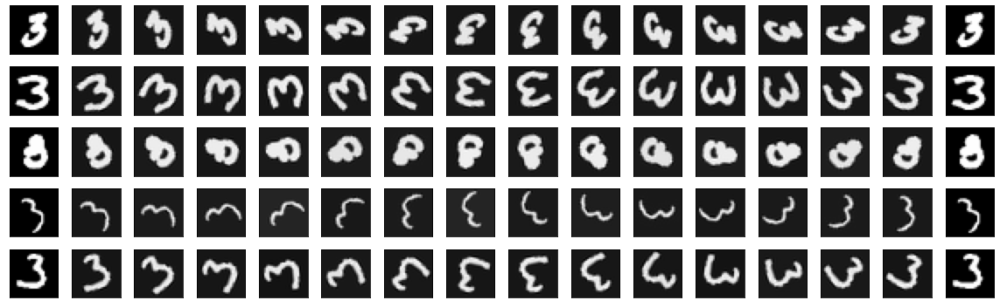

In [18]:
# we read 1042 sequences of length 16, where each observation is a 28x28 grey-scale image
Ymnist = loadmat('etc/rotating-3s.mat')['X'].squeeze().reshape([1042,16,1,28,28])
Ymnist = torch.tensor(Ymnist).to(torch.float32).to(device)
Ymnist_tr, Ymnist_test = Ymnist[:750], Ymnist[750:]
plot_mnist_sequences(Ymnist_tr)

# let's create artificial time points corresponding to rotation angles
tmnist = 0.1*torch.arange(16).to(device)

We now implement our `ODEVAE` class. If you would like to learn more about the encoder and decoder implementation details, check out `vae_utils.py`. 

In [19]:
from torch.distributions import Normal, kl_divergence

class ODEVAE(nn.Module):
    def __init__(self, q, n_filt=16):
        ''' Inputs:
                q      - latent dimensionaliy
                n_filt - number of filters in the first CNN layer
        '''
        super().__init__()
        self.encoder = MNIST_Encoder(q, n_filt)
        self.bnode   = BNODE(q)
        self.decoder = MNIST_Decoder(q, n_filt)
        self.loss    = nn.BCELoss(reduction='sum')
        self.q       = q
        
    def forward(self, t, Y, L=1):
        ''' Performs encoding, latent forward integration and decoding.
            Note that we always draw a single sample from the encoder to improve the readibility of our code.
            Inputs:
                t - [t]           observation time points
                Y - [N,T,1,28,28] input sequences
                L - int           number of Monte Carlo samples for ODE integration
            Returns:
                q_z0_mu  - [N,q]           initial value means
                q_z0_sig - [N,q]           initial value std
                zt       - [L,N,T,q]       latent trajectoy
                Xhat     - [L,N,T,1,28,28] reconstructions
        '''
        [N,T,nc,d,d] = Y.shape
        # encode mean and variance
        q_z0_mu, q_z0_sig = self.encoder(Y) # N,q & N,q
        # sample initial values (one per trajectory)
        z0 = q_z0_mu + q_z0_sig*torch.randn_like(q_z0_sig)
        # forward integrate L trajectories, all starting from the same initial value
        zt = self.bnode(t, z0, L=L) # L,N,T,q
        # decode
        Xhat = self.decoder(zt) # L,N,T,nc,d,d
        return q_z0_mu, q_z0_sig, zt, Xhat
    
    def elbo(self, t, Y, L=1):
        ''' Computes the ELBO.
            Note that we always draw a single sample from the encoder to improve the readibility of our code.
            Inputs:
                t - [t] observation time points
                Y - [N,T,1,28,28] input sequences
                L - number of Monte Carlo samples for ODE integration
            Returns:
                rec    - [] expected log likelihood
                kl_enc - [] the KL term due to z_0 
                kl_bnn - [] the KL term due to bnn weights w
        '''
        q_z0_mu, q_z0_sig, zt, Xhat = self.forward(t, Y, L)
        # reconstruction
        YL  = torch.stack([Y]*L)
        rec = -self.loss(Xhat,YL) / L
        # KL divergence on z_0
        q_z0_mu, q_z0_sig = q_z0_mu.reshape(-1), q_z0_sig.reshape(-1)
        q = Normal(q_z0_mu,q_z0_sig)
        N = Normal(torch.zeros_like(q_z0_mu),torch.ones_like(q_z0_sig))
        kl_enc = kl_divergence(q,N).sum()
        # KL divergence on bnn weights
        kl_bnn = self.bnode._f.kl()
        return rec, kl_enc, kl_bnn
        
odevae = ODEVAE(q=8).to(device)

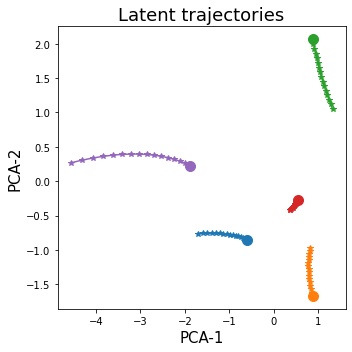

Plotting 5 rotating MNIST sequences (top rows) and corresponding predictions (bottom).


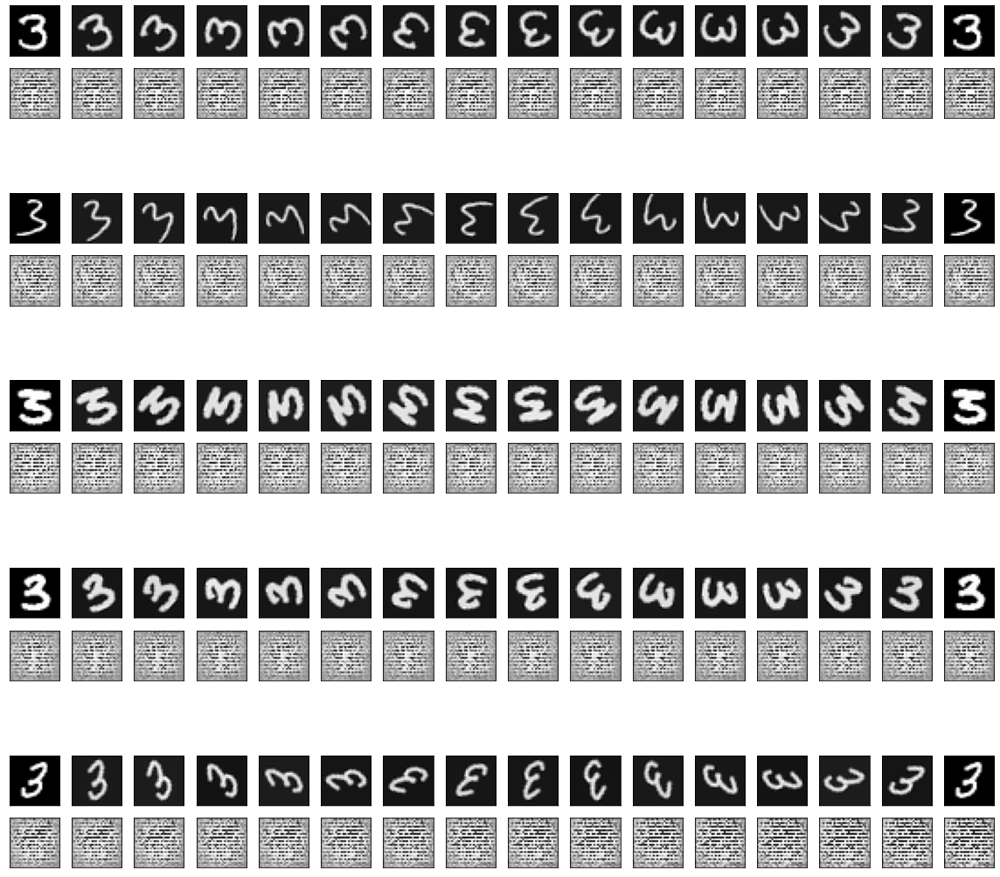

KeyboardInterrupt: 

In [20]:
L     = 5   # number of BNODE Monte Carlo draws to approximate the likelihood
Nsub  = 25  # number of sequences in each minibatch
C     = Ymnist_tr.shape[0] / Nsub # scaling factor
Niter = 2000

optimizer = torch.optim.Adam(odevae.parameters(), 1e-3)

for i in range(Niter):
    optimizer.zero_grad()
    t_,Y_ = get_minibatch(tmnist, Ymnist_tr, Nsub=Nsub)
    rec, kl_enc, kl_bnn = odevae.elbo(t_,Y_)
    rec  = rec*C 
    kl   = kl_enc*C + kl_bnn
    loss = -rec + kl
    loss.backward()
    optimizer.step()
    if i%25==0:
        t_,Y_ = get_minibatch(tmnist, Ymnist_tr, Nsub=5)
        q_z0_mu, q_z0_sig, zt, Xhat = odevae(t_,Y_)
        display.clear_output(wait=True)
        plot_mnist_predictions(Y_, zt, Xhat)


The following three cells import a trained model and then plot the training and test predictions. We first visualize PCA embeddings of the latent trajectories $\mathbf{z}_{0:N}$, where each color corresponds to the embedding of one sequence. Note that a single sample is drawn from the encoder and BNN, i.e., $L=1$. We then visualize five sequences and corresponding predictions. 

In [21]:
# load a trained model
state_dict = torch.load('etc/trained_odevae.pkl')
odevae.load_state_dict(state_dict)
odevae.eval();

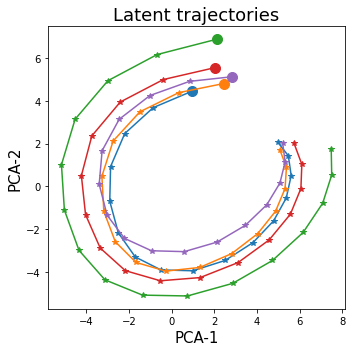

Plotting 5 rotating MNIST sequences (top rows) and corresponding predictions (bottom).


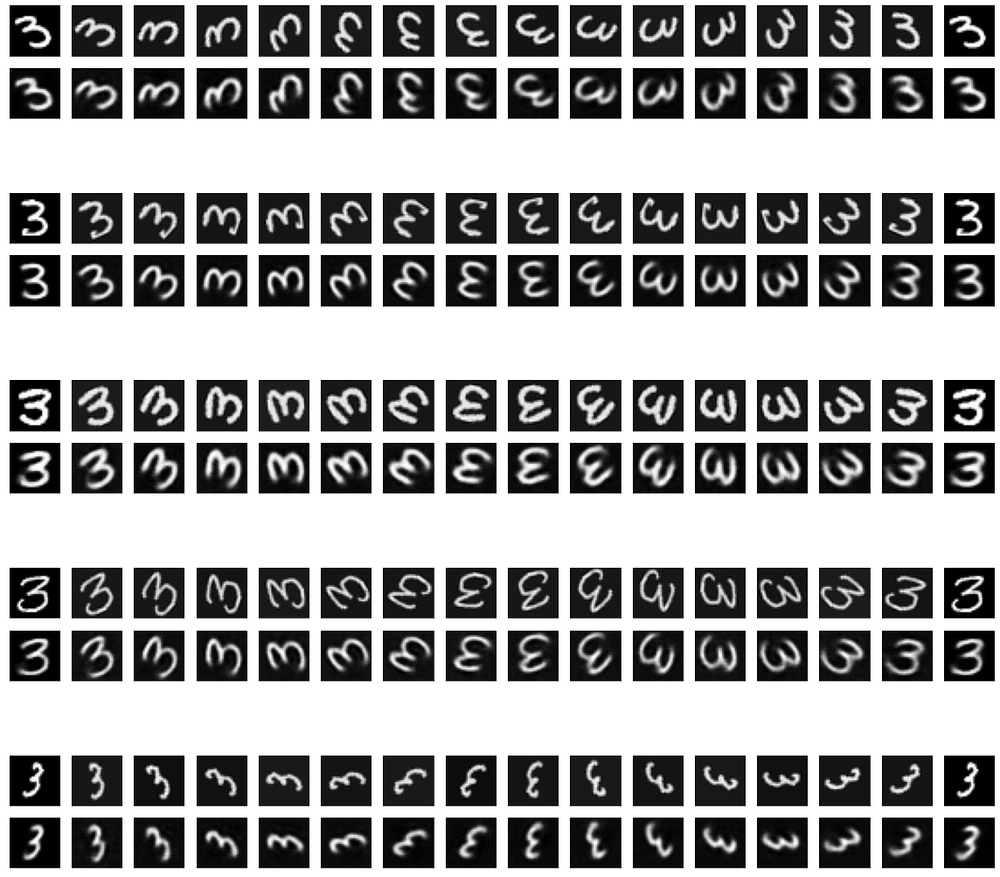

In [22]:
t_,Y_ = get_minibatch(tmnist, Ymnist_tr, Nsub=5)
q_z0_mu, q_z0_sig, zt, Xhat = odevae(t_,Y_)
plot_mnist_predictions(Y_, zt, Xhat)

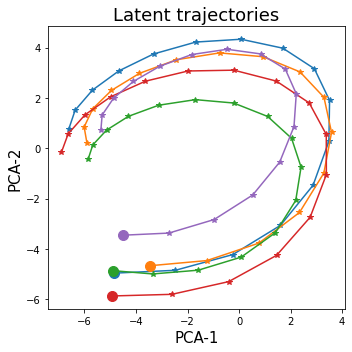

Plotting 5 rotating MNIST sequences (top rows) and corresponding predictions (bottom).


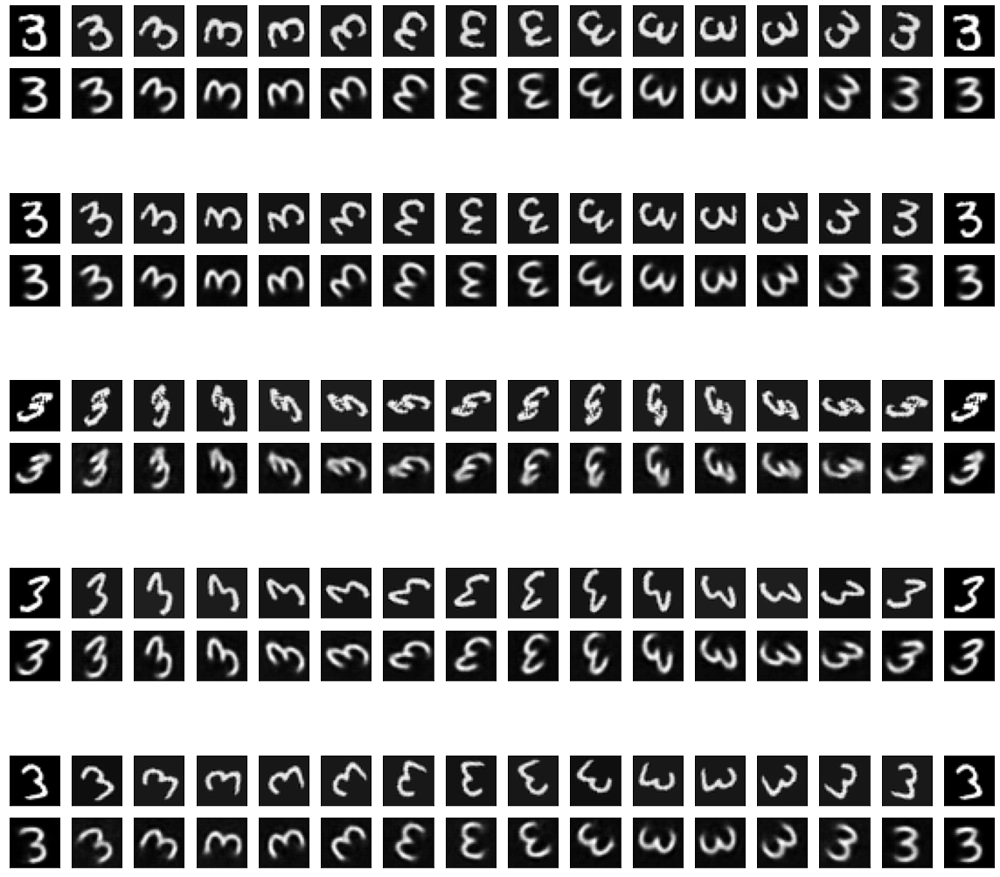

In [23]:
t_,Y_ = get_minibatch(tmnist, Ymnist_test, Nsub=5)
q_z0_mu, q_z0_sig, zt, Xhat = odevae(t_,Y_)
plot_mnist_predictions(Y_, zt, Xhat)

### 5.3. From ODEVAE to ODE$^2$VAE

In a related work, [[yildiz2019deep]](#References) presented ODE$^2$VAE, a second-order variant of the latent Bayesian neural ODEs. This idea relies on the observation that not only the simplest mechanics formulations such as Newton's laws, but also more sophisticated ones such as Lagrangian and Hamiltonian mechanics rely on higher order derivatives. Below are a few highlights about the paper:

- Second-order dynamics can be defined by explicity decomposing the latent space into *position* $\mathbf{s}(t)$ and *momentum* $\mathbf{v}(t)$ components. If the latent state is now defined as $\mathbf{z}(t)\equiv [\mathbf{s}(t),\mathbf{v}(t)]$, the differential function becomes
\begin{equation}
	\frac{d}{dt} \begin{bmatrix} \mathbf{s}(t) \\ \mathbf{v}(t) \end{bmatrix} \equiv \begin{bmatrix} \mathbf{v}(t) \\ \mathbf{f}_\mathbf{w}(\mathbf{s}(t),\mathbf{v}(t)) \end{bmatrix}.
\end{equation} <br>
- This setup also requires two different encoders: The *position encoder* only takes the initial observation $\mathbf{y}_0$ as input while the *momentum encoder* requires multiple observations $\mathbf{y}_{0:M}$ as input since momentum is of higher order. <br><br>
- The authors also propose a prior distribution on the state trajectory $\mathbf{z}_{0:N}$. In turn, the inference requires the instantaneous change of variables formula, which is given by the following integral:
\begin{equation}
\frac{\partial \log(p(\mathbf{z}(t))}{\partial t} = -\text{Tr} \left( \frac{\partial\mathbf{f}(\mathbf{z}(t))}{\partial \mathbf{z}(t)}\right).
\end{equation}
In low data regimes, this additional prior is shown to help reduce overfitting. <br><br>
- The authors also demonstrate that the second-order variant achieves a smaller future prediction error than its first-order counterpart on a dataset of bouncing ball videos. <br><br>

- The following gif shows the walking seqeunces generated by the model (blue) as well as the corresponding unseen walking sequence (red).<br>

<img src="etc/walking.gif" width="300" align="center">

## References

*Sorted by date, URLs in blue.*

[[mackay1992practical]](https://authors.library.caltech.edu/13793/1/MACnc92b.pdf) MacKay, David JC. "A practical Bayesian framework for backpropagation networks." Neural computation 4.3 (1992): 448-472.

[[neal1995bayesian]](https://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.446.9306&rep=rep1&type=pdf) Neal, R. M. "Bayesian Learning for Neural Networks.", Ph.D. Thesis, Dept. of Computer Science, University of Toronto (1995).

[[neal2011mcmc]](https://arxiv.org/abs/1206.1901) Neal, Radford M. "MCMC using Hamiltonian dynamics." Handbook of markov chain monte carlo. (2011).

[[blundell2015weight]](http://proceedings.mlr.press/v37/blundell15.html) Blundell, Charles, et al. "Weight uncertainty in neural network." International Conference on Machine Learning. PMLR, 2015.

[[hernandez2015probabilistic]](http://proceedings.mlr.press/v37/hernandez-lobatoc15.html) Hernández-Lobato, José Miguel, and Ryan Adams. "Probabilistic backpropagation for scalable learning of bayesian neural networks." International Conference on Machine Learning. PMLR, 2015.

[[gal2016dropout]](http://proceedings.mlr.press/v48/gal16.html)  Gal, Yarin, and Zoubin Ghahramani. "Dropout as a bayesian approximation: Representing model uncertainty in deep learning." International Conference on Machine Learning. PMLR, 2016.

[[lakshminarayanan2017simple]](https://papers.nips.cc/paper/2017/hash/9ef2ed4b7fd2c810847ffa5fa85bce38-Abstract.html) Lakshminarayanan, Balaji, Alexander Pritzel, and Charles Blundell. "Simple and scalable predictive uncertainty estimation using deep ensembles." NIPS (2017).

[[alemi2018fixing]](http://proceedings.mlr.press/v80/alemi18a.html) Alemi, Alexander, et al. "Fixing a broken ELBO." International Conference on Machine Learning. PMLR, 2018.

[[chen2018neural]](https://papers.nips.cc/paper/2018/hash/69386f6bb1dfed68692a24c8686939b9-Abstract.html) Chen, Ricky TQ, et al. "Neural ordinary differential equations." NeurIPS (2018).

[[sun2019functional]](https://openreview.net/forum?id=rkxacs0qY7) Sun, Shengyang, et al. "Functional variational bayesian neural networks." ICLR (2019).

[[yildiz2019deep]](https://openreview.net/forum?id=rkxacs0qY7)  Yildiz, Cagatay, Markus Heinonen, and Harri Lähdesmäki. "ODE2VAE: Deep generative second order ODEs with Bayesian neural networks." NeurIPS (2019).

[[jospin2020hands]](https://arxiv.org/abs/2007.06823) Jospin, Laurent Valentin, et al. "Hands-on Bayesian Neural Networks--a Tutorial for Deep Learning Users." arXiv preprint arXiv:2007.06823 (2020).

[[izmailov2021what]](https://arxiv.org/abs/2104.14421) Izmailov, Pavel, et al. "What Are Bayesian Neural Network Posteriors Really Like?." arXiv preprint arXiv:2104.14421 (2021).

[[zhuang2021mali]](https://openreview.net/forum?id=blfSjHeFM_e) Zhuang, Juntang, et al. "MALI: A memory efficient and reverse accurate integrator for Neural ODEs." ICLR (2021).